In [2]:
import pandas as pd 
import numpy as np  
import seaborn as sns 
import matplotlib.pyplot as plt 
import matplotlib.gridspec as gridspec 
from imblearn.pipeline import make_pipeline as make_pipeline_imb # To do our transformation in a unique time
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import make_pipeline
from imblearn.metrics import classification_report_imbalanced

from sklearn.model_selection import train_test_split
from collections import Counter

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import precision_score, recall_score, fbeta_score, confusion_matrix, precision_recall_curve, accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

## Read and Prepare the dataset

In [3]:
# load only 300,000 rows due to PC limitation
df = pd.read_csv("2018.csv", nrows=300000)


In [4]:
df

,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,TAXI_OUT,WHEELS_OFF,...,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,Unnamed: 27
0,2018-01-01,UA,2429,EWR,DEN,1517,1512.0,-5.0,15.0,1527.0,...,268.0,250.0,225.0,1605.0,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-01-01,UA,2427,LAS,SFO,1115,1107.0,-8.0,11.0,1118.0,...,99.0,83.0,65.0,414.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2018-01-01,UA,2426,SNA,DEN,1335,1330.0,-5.0,15.0,1345.0,...,134.0,126.0,106.0,846.0,NaN,NaN,NaN,NaN,NaN,NaN
3,2018-01-01,UA,2425,RSW,ORD,1546,1552.0,6.0,19.0,1611.0,...,190.0,182.0,157.0,1120.0,NaN,NaN,NaN,NaN,NaN,NaN
4,2018-01-01,UA,2424,ORD,ALB,630,650.0,20.0,13.0,703.0,...,112.0,106.0,83.0,723.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299995,2018-01-17,MQ,3773,GSO,LGA,1700,1820.0,80.0,20.0,1840.0,...,103.0,113.0,66.0,461.0,0.0,20.0,10.0,0.0,60.0,NaN
299996,2018-01-17,MQ,3773,LGA,GSO,1440,1459.0,19.0,56.0,1555.0,...,115.0,156.0,89.0,461.0,0.0,19.0,41.0,0.0,0.0,NaN
299997,2018-01-17,MQ,3774,CMH,LGA,1627,1824.0,117.0,7.0,1831.0,...,110.0,103.0,84.0,479.0,37.0,0.0,0.0,0.0,73.0,NaN
299998,2018-01-17,MQ,3774,LGA,CMH,1403,1446.0,43.0,63.0,1549.0,...,119.0,154.0,82.0,479.0,43.0,0.0,35.0,0.0,0.0,NaN


In [5]:
flight_ids = range(1, len(df) + 1)

# Add this new column to dataframe df
df['flight_id'] = flight_ids

Descriptive Statistics:
        OP_CARRIER_FL_NUM   CRS_DEP_TIME       DEP_TIME      DEP_DELAY  \
count      300000.000000  300000.000000  287601.000000  287274.000000   
mean         2571.684417    1328.406513    1338.732167      14.048581   
std          1894.613086     488.553170     500.873534      52.328898   
min             1.000000       1.000000       1.000000     -49.000000   
25%           905.750000     915.000000     924.000000      -5.000000   
50%          2016.000000    1320.000000    1332.000000      -1.000000   
75%          4045.000000    1733.000000    1744.000000      12.000000   
max          7439.000000    2359.000000    2400.000000    2007.000000   

            TAXI_OUT     WHEELS_OFF      WHEELS_ON        TAXI_IN  \
count  287450.000000  287450.000000  287129.000000  287129.000000   
mean       18.050628    1363.860731    1473.859011       7.750461   
std        10.822997     501.220433     527.214785       6.369986   
min         1.000000       1.000000      

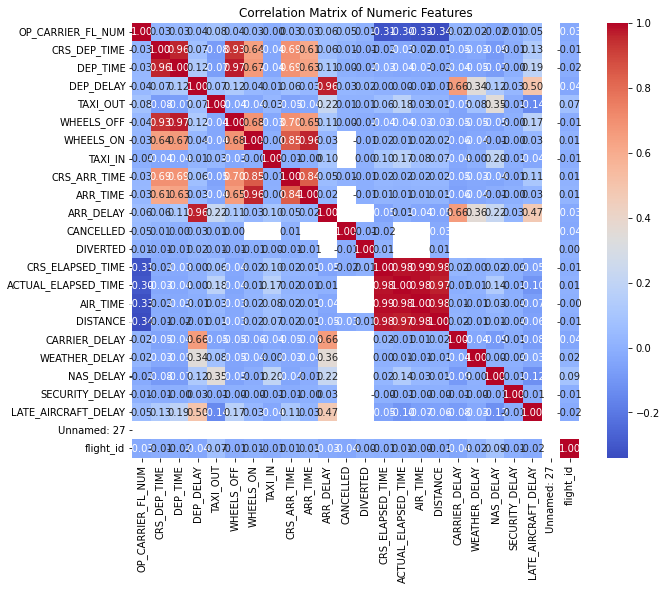

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Descriptive Statistics
print("Descriptive Statistics:\n", df.describe())

# 2. Data Types and Missing Values
print("\nData Types and Missing Information:")
print(df.info())

# 3. Unique Counts
print("\nUnique Counts in Each Column:")
for column in df.columns:
    print(f"{column}: {df[column].nunique()} unique values")

# 4. Correlation Matrix
correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Numeric Features')
plt.show()



## EDA and Feature Engineering

In [7]:
df.drop('Unnamed: 27', axis=1, inplace=True)


In [8]:
# Handle missing DEP_TIME for cancelled or diverted flights
df.loc[df['CANCELLED'] == 1, 'DEP_TIME'] = df['CRS_DEP_TIME']
df.loc[df['DIVERTED'] == 1, 'DEP_TIME'] = df['CRS_DEP_TIME']

# Create a target column for classification categories
df['CLASSIFICATION'] = 'SCHEDULED'  # Default classification
df.loc[df['DEP_DELAY'] >= 15, 'CLASSIFICATION'] = 'DEPARTURE_DELAYED'
df.loc[(df['CANCELLED'] == 1) | (df['DIVERTED'] == 1), 'CLASSIFICATION'] = 'CANCELLED_DIVERTED'

def convert_time_to_minutes(time_val):
    if pd.isna(time_val):
        return np.nan  # Return NaN for missing values
    try:
        # Attempt to handle time formatted as HHMM (e.g., '1517')
        time_str = f"{int(time_val):04d}"  # Zero-padding to four digits
        hour = int(time_str[:2])
        minute = int(time_str[2:])
    except ValueError:
        # Handle time formatted as HH:MM (e.g., '15:17')
        if ':' in time_val:
            hour, minute = map(int, time_val.split(':'))
        else:
            return np.nan  # Return NaN for any other formats
    if hour == 24:
        hour = 0  # Convert '2400' to '0000'
    total_minutes = hour * 60 + minute
    return total_minutes


# Apply the function to convert time columns to minutes since midnight
df['CRS_DEP_TIME'] = df['CRS_DEP_TIME'].apply(convert_time_to_minutes)
df['DEP_TIME'] = df['DEP_TIME'].apply(convert_time_to_minutes)
df['CRS_ARR_TIME'] = df['CRS_ARR_TIME'].apply(convert_time_to_minutes)
df['ARR_TIME'] = df['ARR_TIME'].apply(convert_time_to_minutes)


# Function to categorize time of day
def get_time_of_day(hour):
    if 6 <= hour < 10:
        return '6-10am'
    elif 10 <= hour < 14:
        return '10-2pm'
    elif 14 <= hour < 18:
        return '2-6pm'
    elif 18 <= hour < 22:
        return '6-10pm'
    else:
        return '10pm-6am'

# Apply conversion to the entire DataFrame
df['CRS_DEP_HOUR'] = pd.to_datetime(df['CRS_DEP_TIME'], format='%H%M', errors='coerce').dt.hour
df['TIME_OF_DAY'] = df['CRS_DEP_HOUR'].apply(get_time_of_day)

# Convert the FL_DATE column to datetime and extract related features
df['FL_DATE'] = pd.to_datetime(df['FL_DATE'])

df['DAY_OF_WEEK'] = df['FL_DATE'].dt.dayofweek
df['DAY_OF_MONTH'] = df['FL_DATE'].dt.day
df['IS_WEEKEND'] = df['DAY_OF_WEEK'].apply(lambda x: 1 if x >= 5 else 0)

# Define public holidays and eve of public holidays for January 2018
public_holidays = [1, 15]  # Assuming 1st and 15th January are holidays
eve_public_holidays = [x - 1 for x in public_holidays]

# Create columns for public holidays and eve of public holidays
df['IS_PUBLIC_HOLIDAY'] = df['DAY_OF_MONTH'].apply(lambda x: 1 if x in public_holidays else 0)
df['IS_EVE_PUBLIC_HOLIDAY'] = df['DAY_OF_MONTH'].apply(lambda x: 1 if x in eve_public_holidays else 0)

def categorize_flight_distance(elapsed_time):
    if elapsed_time < 180:
        return 'Short-Haul'
    elif 180 <= elapsed_time <= 360:
        return 'Medium-Haul'
    else:
        return 'Long-Haul'

# Apply the function to create a new column
df['FLIGHT_CATEGORY'] = df['CRS_ELAPSED_TIME'].apply(categorize_flight_distance)


# Drop columns to prevent data leakage
df_leakage = ['DEP_TIME', 'DEP_DELAY', 'TAXI_OUT', 'WHEELS_OFF', 'WHEELS_ON', 
              'TAXI_IN', 'ARR_TIME', 'ARR_DELAY', 'CANCELLED', 'CANCELLATION_CODE',
              'DIVERTED', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 'CARRIER_DELAY',
              'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']
df_processed = df.drop(columns=df_leakage)

# Save the processed DataFrame to a new CSV file
# df_processed.to_csv('processed_2018_Jan.csv', index=False)


In [9]:
df_processed['DEST'].unique()

array(['DEN', 'SFO', 'ORD', 'ALB', 'OMA', 'LAS', 'CID', 'EWR', 'CLE',
       'PDX', 'ATL', 'BTV', 'LAX', 'SMF', 'JAC', 'TYS', 'IAH', 'HNL',
       'MIA', 'IAD', 'RIC', 'RSW', 'FLL', 'SAN', 'SLC', 'ICT', 'RNO',
       'EUG', 'MCO', 'MCI', 'DTW', 'CLT', 'BOS', 'PHX', 'BZN', 'MSY',
       'SJC', 'MSP', 'PBI', 'DFW', 'SAT', 'AUS', 'LGA', 'IND', 'TPA',
       'PHL', 'BWI', 'BNA', 'DCA', 'MFE', 'ONT', 'SRQ', 'SJU', 'SNA',
       'RDU', 'HDN', 'SEA', 'PSP', 'BDL', 'OKC', 'ROC', 'TUS', 'ABQ',
       'PWM', 'MYR', 'KOA', 'OGG', 'JAX', 'LIH', 'BUF', 'ORF', 'EGE',
       'SAV', 'CHS', 'GUC', 'AVL', 'ANC', 'PIT', 'ITO', 'GEG', 'MTJ',
       'BIL', 'CVG', 'BOI', 'MKE', 'GUM', 'JFK', 'BET', 'ADQ', 'SCC',
       'BRW', 'FAI', 'KTN', 'JNU', 'SIT', 'PSG', 'WRG', 'OME', 'OTZ',
       'OAK', 'BLI', 'SBA', 'BUR', 'STL', 'GFK', 'MDT', 'DSM', 'JAN',
       'ABY', 'LAN', 'CWA', 'GSO', 'SYR', 'AEX', 'MOT', 'BQK', 'BMI',
       'CAE', 'DHN', 'EWN', 'MSN', 'ILM', 'BGR', 'FAR', 'FSD', 'GRB',
       'LFT', 'TVC',

In [10]:
df_processed['ORIGIN'].unique()

array(['EWR', 'LAS', 'SNA', 'RSW', 'ORD', 'IAH', 'DEN', 'SMF', 'RIC',
       'PDX', 'MCO', 'TYS', 'SFO', 'JAC', 'BOS', 'MSY', 'MIA', 'SEA',
       'SAT', 'SLC', 'RDU', 'FLL', 'IAD', 'DFW', 'ANC', 'MSP', 'ALB',
       'LAX', 'IND', 'SAN', 'BNA', 'BDL', 'ABQ', 'SAV', 'PHX', 'AUS',
       'PHL', 'SJC', 'ORF', 'DCA', 'LGA', 'BWI', 'PIT', 'OGG', 'CLE',
       'TPA', 'MYR', 'ROC', 'SJU', 'EGE', 'HNL', 'ONT', 'PBI', 'MKE',
       'HDN', 'JAX', 'OKC', 'ATL', 'SRQ', 'BZN', 'EUG', 'BOI', 'RNO',
       'GEG', 'TUS', 'LIH', 'KOA', 'ITO', 'PSP', 'DTW', 'GUC', 'OMA',
       'MTJ', 'CLT', 'CHS', 'MCI', 'BIL', 'CVG', 'MFE', 'CID', 'MEM',
       'AVL', 'BUF', 'GUM', 'JFK', 'ADQ', 'BET', 'SCC', 'BRW', 'FAI',
       'JNU', 'KTN', 'SIT', 'PSG', 'WRG', 'OME', 'OTZ', 'BUR', 'OAK',
       'BLI', 'SBA', 'STL', 'GFK', 'SYR', 'GSP', 'FSD', 'DSM', 'ILM',
       'PWM', 'BIS', 'JAN', 'GRB', 'OAJ', 'BTV', 'TLH', 'LAN', 'MSN',
       'BMI', 'BGR', 'ABY', 'MOT', 'DHN', 'LEX', 'MDT', 'CMH', 'FSM',
       'HSV', 'FAR',

In [11]:
import pandas as pd

# List of airport codes corresponding to state capitals or major cities serving as primary airport hubs
state_capitals = [
    'ATL',  # Atlanta, Georgia
    'BOS',  # Boston, Massachusetts
    'DEN',  # Denver, Colorado
    'IND',  # Indianapolis, Indiana
    'JFK',  # New York, NY
    'LAX',  # Los Angeles, California
    'MIA',  # Miami, Florida
    'PHX',  # Phoenix, Arizona
    'RDU',  # Raleigh, North Carolina
    'SAC',  # Sacramento, California
    'SDF',  # Louisville, Kentucky
    'SJC',  # San Jose, California
    'BHM',  # Birmingham, Alabama
    'LIT',  # Little Rock, Arkansas
    'HFD',  # Hartford, Connecticut
    'DOV',  # Dover, Delaware
    'TLH',  # Tallahassee, Florida
    'BOI',  # Boise, Idaho
    'SPI',  # Springfield, Illinois
    'DSM',  # Des Moines, Iowa
    'TOP',  # Topeka, Kansas
    'BTR',  # Baton Rouge, Louisiana
    'AUG',  # Augusta, Maine
    'LAN',  # Lansing, Michigan
    'STP',  # Saint Paul, Minnesota
    'JAN',  # Jackson, Mississippi
    'JEFF', # Jefferson City, Missouri
    'HELE', # Helena, Montana
    'LIN',  # Lincoln, Nebraska
    'CAR',  # Carson City, Nevada
    'CON',  # Concord, New Hampshire
    'SFE',  # Santa Fe, New Mexico
    'BIS',  # Bismarck, North Dakota
    'COL',  # Columbus, Ohio
    'OKC',  # Oklahoma City, Oklahoma
    'SALE', # Salem, Oregon
    'HAR',  # Harrisburg, Pennsylvania
    'PROV', # Providence, Rhode Island
    'PIE',  # Pierre, South Dakota
    'NAS',  # Nashville, Tennessee
    'AUS',  # Austin, Texas
    'SLC',  # Salt Lake City, Utah
    'MONT', # Montpelier, Vermont
    'OLY',  # Olympia, Washington
    'CHAR', # Charleston, West Virginia
    'MAD',  # Madison, Wisconsin
    'CHEY', # Cheyenne, Wyoming
]

# Map each city code to 1 if it's a state capital or major city, 0 otherwise
df_processed['IS_ORIGIN_CAPITAL'] = df_processed['ORIGIN'].apply(lambda x: 1 if x in state_capitals else 0)
df_processed['IS_DESTINATION_CAPITAL'] = df_processed['DEST'].apply(lambda x: 1 if x in state_capitals else 0)



In [12]:
print("Data type of CRS_DEP_TIME column:", df_processed['CRS_DEP_TIME'].dtype)

Data type of CRS_DEP_TIME column: int64


In [13]:
df_processed

,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,CRS_ARR_TIME,CRS_ELAPSED_TIME,DISTANCE,flight_id,...,CRS_DEP_HOUR,TIME_OF_DAY,DAY_OF_WEEK,DAY_OF_MONTH,IS_WEEKEND,IS_PUBLIC_HOLIDAY,IS_EVE_PUBLIC_HOLIDAY,FLIGHT_CATEGORY,IS_ORIGIN_CAPITAL,IS_DESTINATION_CAPITAL
0,2018-01-01,UA,2429,EWR,DEN,917,1065,268.0,1605.0,1,...,9.0,6-10am,0,1,0,1,0,Medium-Haul,0,1
1,2018-01-01,UA,2427,LAS,SFO,675,774,99.0,414.0,2,...,NaN,10pm-6am,0,1,0,1,0,Short-Haul,0,0
2,2018-01-01,UA,2426,SNA,DEN,815,1009,134.0,846.0,3,...,8.0,6-10am,0,1,0,1,0,Short-Haul,0,1
3,2018-01-01,UA,2425,RSW,ORD,946,1076,190.0,1120.0,4,...,9.0,6-10am,0,1,0,1,0,Medium-Haul,0,0
4,2018-01-01,UA,2424,ORD,ALB,390,562,112.0,723.0,5,...,NaN,10pm-6am,0,1,0,1,0,Short-Haul,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299995,2018-01-17,MQ,3773,GSO,LGA,1020,1123,103.0,461.0,299996,...,10.0,10-2pm,2,17,0,0,0,Short-Haul,0,0
299996,2018-01-17,MQ,3773,LGA,GSO,880,995,115.0,461.0,299997,...,NaN,10pm-6am,2,17,0,0,0,Short-Haul,0,0
299997,2018-01-17,MQ,3774,CMH,LGA,987,1097,110.0,479.0,299998,...,NaN,10pm-6am,2,17,0,0,0,Short-Haul,0,0
299998,2018-01-17,MQ,3774,LGA,CMH,843,962,119.0,479.0,299999,...,8.0,6-10am,2,17,0,0,0,Short-Haul,0,0


In [14]:
# Apply one-hot encoding to the TIME_OF_DAY column
time_of_day_dummies = pd.get_dummies(df_processed['TIME_OF_DAY'], prefix='TimeOfDay')

# Concatenate the new columns with the original DataFrame
df_processed = pd.concat([df_processed, time_of_day_dummies], axis=1)

# Now you can drop the original TIME_OF_DAY and CRS_DEP_HOUR columns as they are redundant
df_processed.drop(['TIME_OF_DAY', 'CRS_DEP_HOUR'], axis=1, inplace=True)


# Apply one-hot encoding to the flight_category column
flight_category_dummies = pd.get_dummies(df_processed['FLIGHT_CATEGORY'], prefix='FlightCat')

# Concatenate the new columns with the original DataFrame
df_processed = pd.concat([df_processed, flight_category_dummies], axis=1)

# Optionally, drop the original 'FLIGHT_CATEGORY' column if you won't need it anymore
df_processed.drop('FLIGHT_CATEGORY', axis=1, inplace=True)



In [15]:
#drop unique identifier
df_processed.drop('flight_id', axis=1, inplace=True)

In [16]:
df_processed

,FL_DATE,OP_CARRIER,OP_CARRIER_FL_NUM,ORIGIN,DEST,CRS_DEP_TIME,CRS_ARR_TIME,CRS_ELAPSED_TIME,DISTANCE,CLASSIFICATION,...,IS_ORIGIN_CAPITAL,IS_DESTINATION_CAPITAL,TimeOfDay_10-2pm,TimeOfDay_10pm-6am,TimeOfDay_2-6pm,TimeOfDay_6-10am,TimeOfDay_6-10pm,FlightCat_Long-Haul,FlightCat_Medium-Haul,FlightCat_Short-Haul
0,2018-01-01,UA,2429,EWR,DEN,917,1065,268.0,1605.0,SCHEDULED,...,0,1,0,0,0,1,0,0,1,0
1,2018-01-01,UA,2427,LAS,SFO,675,774,99.0,414.0,SCHEDULED,...,0,0,0,1,0,0,0,0,0,1
2,2018-01-01,UA,2426,SNA,DEN,815,1009,134.0,846.0,SCHEDULED,...,0,1,0,0,0,1,0,0,0,1
3,2018-01-01,UA,2425,RSW,ORD,946,1076,190.0,1120.0,SCHEDULED,...,0,0,0,0,0,1,0,0,1,0
4,2018-01-01,UA,2424,ORD,ALB,390,562,112.0,723.0,DEPARTURE_DELAYED,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299995,2018-01-17,MQ,3773,GSO,LGA,1020,1123,103.0,461.0,DEPARTURE_DELAYED,...,0,0,1,0,0,0,0,0,0,1
299996,2018-01-17,MQ,3773,LGA,GSO,880,995,115.0,461.0,DEPARTURE_DELAYED,...,0,0,0,1,0,0,0,0,0,1
299997,2018-01-17,MQ,3774,CMH,LGA,987,1097,110.0,479.0,DEPARTURE_DELAYED,...,0,0,0,1,0,0,0,0,0,1
299998,2018-01-17,MQ,3774,LGA,CMH,843,962,119.0,479.0,DEPARTURE_DELAYED,...,0,0,0,0,0,1,0,0,0,1


## Train test split, model evaluation of the imbalanced data

In [17]:
from imblearn.over_sampling import SMOTE

# Check balance
print(df_processed['CLASSIFICATION'].value_counts())



SCHEDULED             221017
DEPARTURE_DELAYED      65515
CANCELLED_DIVERTED     13468
Name: CLASSIFICATION, dtype: int64


In [18]:
import pandas as pd

# Select numerical columns
numerical_cols = df_processed.select_dtypes(include=['int64', 'float64']).columns
print("Numerical columns:")
print(numerical_cols)

# Select categorical columns
categorical_cols = df_processed.select_dtypes(include=['object']).columns
print("\nCategorical columns:")
print(categorical_cols)


Numerical columns:
Index(['OP_CARRIER_FL_NUM', 'CRS_DEP_TIME', 'CRS_ARR_TIME', 'CRS_ELAPSED_TIME',
       'DISTANCE', 'DAY_OF_WEEK', 'DAY_OF_MONTH', 'IS_WEEKEND',
       'IS_PUBLIC_HOLIDAY', 'IS_EVE_PUBLIC_HOLIDAY', 'IS_ORIGIN_CAPITAL',
       'IS_DESTINATION_CAPITAL'],
      dtype='object')

Categorical columns:
Index(['OP_CARRIER', 'ORIGIN', 'DEST', 'CLASSIFICATION'], dtype='object')


In [19]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

# Define numerical and categorical columns
numerical_cols = ['CRS_ARR_TIME', 'CRS_ELAPSED_TIME', 'DISTANCE', 'DAY_OF_MONTH']
categorical_cols = ['OP_CARRIER', 'DAY_OF_WEEK', 'IS_WEEKEND', 'IS_PUBLIC_HOLIDAY', 'IS_EVE_PUBLIC_HOLIDAY', 'ORIGIN', 'DEST']

# Exclude the target and date columns for feature matrix X and define target y
X = df_processed.drop(['CLASSIFICATION', 'FL_DATE'], axis=1)
y = df_processed['CLASSIFICATION']

# Encode the target variable
le_classification = LabelEncoder()
y_encoded = le_classification.fit_transform(y)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Initialize and fit label encoders for ORIGIN and DEST
le_origin = LabelEncoder()
le_dest = LabelEncoder()
X_train['ORIGIN'] = le_origin.fit_transform(X_train['ORIGIN'])
X_test['ORIGIN'] = le_origin.transform(X_test['ORIGIN'])
X_train['DEST'] = le_dest.fit_transform(X_train['DEST'])
X_test['DEST'] = le_dest.transform(X_test['DEST'])

# Drop the OP_CARRIER_FL_NUM column if it's not needed for the analysis
X_train.drop('OP_CARRIER_FL_NUM', axis=1, inplace=True)
X_test.drop('OP_CARRIER_FL_NUM', axis=1, inplace=True)

# Apply scaling only to numerical columns
scaler = StandardScaler()
X_train[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])
X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])

# One-hot encode categorical features on both training and testing datasets
X_train = pd.get_dummies(X_train, columns=categorical_cols, drop_first=True)
X_test = pd.get_dummies(X_test, columns=categorical_cols, drop_first=True)

# Ensure both dataframes have the same dummy columns
X_train, X_test = X_train.align(X_test, join='outer', axis=1, fill_value=0)

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)


In [20]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 60000 entries, 4941 to 72612
Columns: 705 entries, CRS_ARR_TIME to TimeOfDay_6-10pm
dtypes: float64(4), int64(9), uint8(692)
memory usage: 46.0 MB


In [21]:
X_train_smote.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 529932 entries, 0 to 529931
Columns: 705 entries, CRS_ARR_TIME to TimeOfDay_6-10pm
dtypes: float64(4), int64(3), uint8(698)
memory usage: 381.1 MB


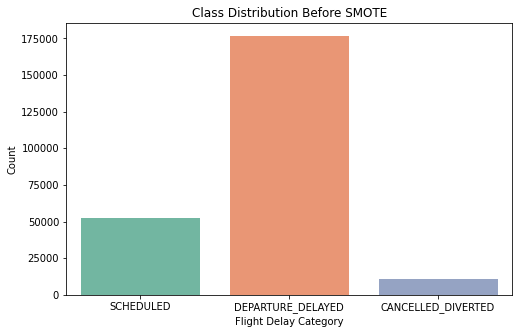

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter

# Assuming `y_train` is your target data before applying SMOTE
# Replace `y_train` with the actual variable name you have

# Count the occurrences of each class in the original target variable
original_counts = Counter(y_train)

# Create a DataFrame for seaborn plotting
original_counts_df = pd.DataFrame.from_dict(original_counts, orient='index', columns=['Count'])
original_counts_df.index = ['SCHEDULED', 'DEPARTURE_DELAYED', 'CANCELLED_DIVERTED']  # Replace with your actual class names

# Plot the class distribution using seaborn
plt.figure(figsize=(8, 5))
sns.barplot(x=original_counts_df.index, y=original_counts_df['Count'], palette='Set2')
plt.title('Class Distribution Before SMOTE')
plt.xlabel('Flight Delay Category')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


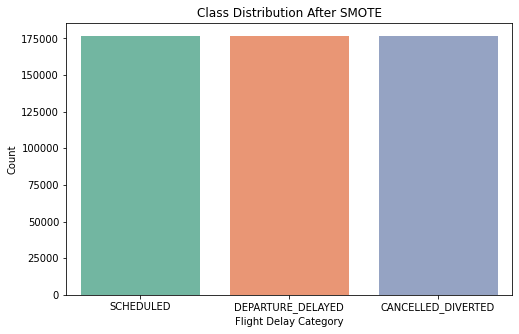

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter

# Assuming that X_train_smote and y_train_smote are your SMOTE-enhanced training data
# Ensure SMOTE has already been applied:
# smote = SMOTE(random_state=42)
# X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Count the occurrences of each class in the resampled target variable
smote_counts = Counter(y_train_smote)

# Create a DataFrame for seaborn plotting
smote_counts_df = pd.DataFrame.from_dict(smote_counts, orient='index', columns=['Count'])
smote_counts_df.index = ['SCHEDULED', 'DEPARTURE_DELAYED', 'CANCELLED_DIVERTED']  # Replace with your actual class names

# Plot the class distribution using seaborn
plt.figure(figsize=(8, 5))
sns.barplot(x=smote_counts_df.index, y=smote_counts_df['Count'], palette='Set2')
plt.title('Class Distribution After SMOTE')
plt.xlabel('Flight Delay Category')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


*Selling to an Insurance Company*

Insurance companies are often concerned with risk management and cost optimization. They might be particularly interested in minimizing the costs associated with false negatives and false positives in specific classes:

False Negatives for CANCELLED_DIVERTED: Missing a prediction where a flight is cancelled or diverted could be costly in terms of payouts for claims related to travel disruptions.
False Positives for DEPARTURE_DELAYED: Incorrectly predicting a delay might lead to unnecessary rebooking costs or compensations.
In this context, the cost matrix could be adjusted to impose higher penalties for misclassifying cancellations and diversions. Precision (minimizing false positives) in predicting cancellations might be prioritized, along with recall (minimizing false negatives) for the same category.

For Insurance Companies: Focus on high recall for CANCELLED_DIVERTED to ensure all potential claims are anticipated. Precision for DEPARTURE_DELAYED to avoid unnecessary costs.

*Selling to Airport/Flight Operator*

Airport and Flight Operators may prioritize accurate information on flight delays more than cancellations, particularly when managing gate assignments, crew scheduling, and logistical coordination. Here, the impact of a false positive (unnecessarily reallocating resources or making announcements for a delay that doesn't happen) or a false negative (failing to inform about an actual delay) could lead to significant operational inefficiencies.

For airport and flight operators, emphasizing a balanced approach is important, but cost matrix can be adjusted to reflect higher penalties for inaccuracies in predicting delays, which impact their logistical planning.

For Airport/Flight Operators: Balanced precision and recall for Departure Delayed ensures that operators receive timely and accurate information about flight changes affecting their scheduling and resource management.

In [22]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
import xgboost as xgb

# Adjusted cost matrices
cost_matrix_operator = np.array([[0, 20, 50],
                                  [50, 10, 80],
                                  [100, 80, 10]])  

cost_matrix_insurance = np.array([[0, 30, 70],
                                 [60, 10, 90],
                                 [100, 90, 20]])  

def calculate_cost_benefit(conf_matrix, cost_matrix):
    # Element-wise multiplication of the confusion matrix and the cost matrix
    total_cost_benefit = np.sum(conf_matrix * cost_matrix)
    return total_cost_benefit

# Assuming X_train_smote and X_test have been transformed and may have different columns
X_train_smote, X_test = X_train_smote.align(X_test, join='outer', axis=1, fill_value=0)

# Logistic Regression
log_reg = LogisticRegression(max_iter=1000, random_state=42)
log_reg.fit(X_train_smote, y_train_smote)
log_reg_preds = log_reg.predict(X_test)

# Evaluation
log_reg_accuracy = accuracy_score(y_test, log_reg_preds)
log_reg_conf_matrix = confusion_matrix(y_test, log_reg_preds)
log_reg_cost_benefit_insurance = calculate_cost_benefit(log_reg_conf_matrix, cost_matrix_insurance)
log_reg_cost_benefit_operator = calculate_cost_benefit(log_reg_conf_matrix, cost_matrix_operator)

print("Logistic Regression Accuracy:", log_reg_accuracy)
print("Logistic Regression Confusion Matrix:\n", log_reg_conf_matrix)
print("Logistic Regression Total Cost/Benefit for Insurance:", log_reg_cost_benefit_insurance)
print("Logistic Regression Total Cost/Benefit for Operator:", log_reg_cost_benefit_operator)


C:\Users\liz_l\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Accuracy: 0.6806166666666666
Logistic Regression Confusion Matrix:
 [[  594   332  1796]
 [  627  3041  9237]
 [ 1897  5274 37202]]
Logistic Regression Total Cost/Benefit for Insurance: 2443440
Logistic Regression Total Cost/Benefit for Operator: 1880800


In [23]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, confusion_matrix

# XGBoost
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)

# Fit the model on the SMOTE-enhanced training data
xgb_model.fit(X_train_smote, y_train_smote)

# Make predictions on the test set
xgb_preds = xgb_model.predict(X_test)

# Evaluate the model
xgb_accuracy = accuracy_score(y_test, xgb_preds)
xgb_conf_matrix = confusion_matrix(y_test, xgb_preds)
xgb_cost_benefit_insurance = calculate_cost_benefit(xgb_conf_matrix, cost_matrix_insurance)
xgb_cost_benefit_operator = calculate_cost_benefit(xgb_conf_matrix, cost_matrix_operator)

print("XGBoost Accuracy:", xgb_accuracy)
print("XGBoost Confusion Matrix:\n", xgb_conf_matrix)
print("XGBoost Total Cost/Benefit for Insurance:", xgb_cost_benefit_insurance)
print("XGBoost Total Cost/Benefit for Operator:", xgb_cost_benefit_operator)


XGBoost Accuracy: 0.7444
XGBoost Confusion Matrix:
 [[ 1259   479   984]
 [  473  4612  7820]
 [ 1009  4571 38793]]
XGBoost Total Cost/Benefit for Insurance: 2149700
XGBoost Total Cost/Benefit for Operator: 1608660


## Feature Importancy, LIME for explainable AI

In [24]:
from sklearn.inspection import permutation_importance

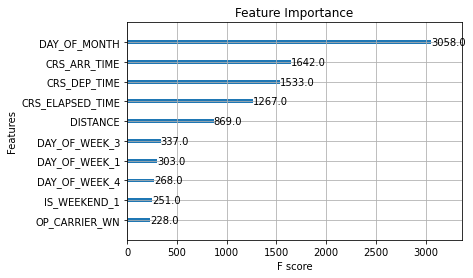

              Feature  Importance
3        DAY_OF_MONTH      3058.0
0        CRS_ARR_TIME      1642.0
1        CRS_DEP_TIME      1533.0
2    CRS_ELAPSED_TIME      1267.0
178          DISTANCE       869.0
..                ...         ...
159           DEST_59         1.0
152           DEST_47         1.0
149           DEST_41         1.0
147           DEST_38         1.0
18           DEST_119         1.0

[365 rows x 2 columns]


In [27]:
import xgboost as xgb
import matplotlib.pyplot as plt

# Plot feature importance
xgb.plot_importance(xgb_model, max_num_features=10)  # You can adjust the number of features you want to plot
plt.title('Feature Importance')
plt.show()

# Alternatively, get feature importance as a dictionary or DataFrame for more detailed analysis
importance_dict = xgb_model.get_booster().get_score(importance_type='weight')  # You can change to 'gain' or 'cover'

# Convert to DataFrame for better visualization and manipulation
importance_df = pd.DataFrame({
    'Feature': list(importance_dict.keys()),
    'Importance': list(importance_dict.values())
})

importance_df.sort_values(by='Importance', ascending=False, inplace=True)
print(importance_df)


In [30]:
import lime
import lime.lime_tabular
from lime.lime_tabular import LimeTabularExplainer


In [31]:
# Create the explainer object with SMOTE-enhanced training data
explainer = LimeTabularExplainer(training_data=X_train_smote.values,
                                 feature_names=X_train.columns.tolist(),  # Ensure feature names align with original data
                                 class_names=['SCHEDULED', 'DEPARTURE_DELAYED', 'CANCELLED_DIVERTED'],
                                 mode='classification')

# Select an instance to explain
instance_index = 0
test_instance = X_test.iloc[instance_index].values

# Generate the LIME explanation for Logistic Regression
exp_log_reg = explainer.explain_instance(test_instance, 
                                         log_reg.predict_proba,  # Use the predict_proba function of your logistic regression model
                                         num_features=10)  # Adjust the number of features shown in the explanation

# Visualize the explanation for Logistic Regression
exp_log_reg.show_in_notebook(show_table=True, show_all=False)

# Generate the LIME explanation for XGBoost
exp_xgb = explainer.explain_instance(test_instance, 
                                     xgb_model.predict_proba,  # Use the predict_proba function of your XGBoost model
                                     num_features=10)  # Adjust the number of features shown in the explanation

# Visualize the explanation for XGBoost
exp_xgb.show_in_notebook(show_table=True, show_all=False)


C:\Users\liz_l\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [32]:
idx =4584  
instance_index = 0  
test_instance = X_test.iloc[instance_index].values

# Generate the LIME explanation
exp = explainer.explain_instance(test_instance, 
                                 log_reg.predict_proba,  # Model prediction probability function
                                 num_features=10)  # You can adjust the number of features you want to show in the explanation

# Visualize the explanation
# This will display the contribution of each feature to the prediction
exp.show_in_notebook(show_table=True, show_all=False) 

C:\Users\liz_l\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [33]:
instance_index = 0  # Adjust the index as needed to explore other instances
test_instance = X_test.iloc[instance_index].values

# Generate the LIME explanation
exp = explainer.explain_instance(test_instance, 
                                 xgb_model.predict_proba,  # Model prediction probability function
                                 num_features=10)  # You can adjust the number of features you want to show in the explanation

# Visualize the explanation
# This will display the contribution of each feature to the prediction
exp.show_in_notebook(show_table=True, show_all=False)

In [34]:
# Define the number of features to explain
num_features_to_explain = 10

# Select an instance to explain
instance_index = 0
test_instance = X_test.iloc[instance_index].values

# Explain instance with Logistic Regression model
exp_log_reg = explainer.explain_instance(test_instance, 
                                         log_reg.predict_proba,
                                         num_features=num_features_to_explain)
# Show the explanation for Logistic Regression
exp_log_reg.show_in_notebook(show_table=True, show_all=False)

# Explain the same instance with XGBoost model
exp_xgb = explainer.explain_instance(test_instance, 
                                     xgb_model.predict_proba,
                                     num_features=num_features_to_explain)
# Show the explanation for XGBoost
exp_xgb.show_in_notebook(show_table=True, show_all=False)


C:\Users\liz_l\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


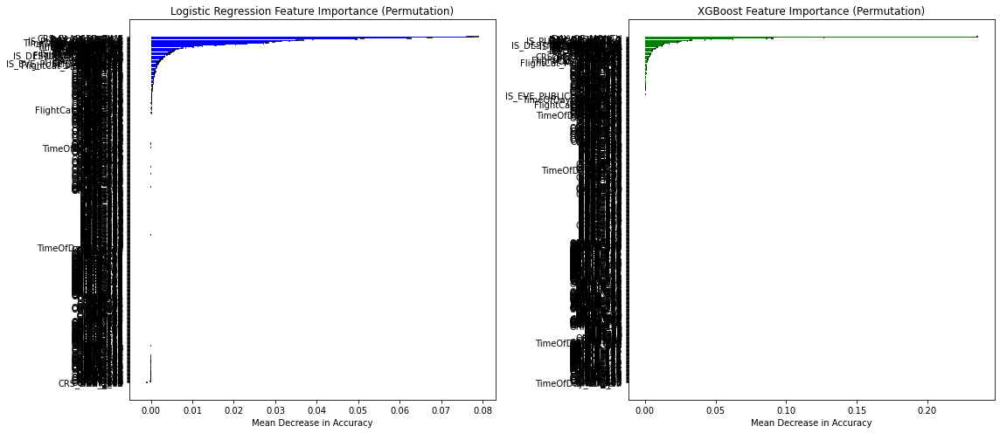

In [37]:
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import numpy as np

# Calculate permutation importance for logistic regression
log_reg_result = permutation_importance(log_reg, X_test, y_test, n_repeats=3, random_state=42, n_jobs=-1)
log_reg_importance_mean = log_reg_result.importances_mean
log_reg_sorted_idx = np.argsort(log_reg_importance_mean)[::-1]
log_reg_features = X_test.columns[log_reg_sorted_idx]
log_reg_importance_mean = log_reg_importance_mean[log_reg_sorted_idx]
log_reg_importance_std = log_reg_result.importances_std[log_reg_sorted_idx]

# Calculate permutation importance for XGBoost
xgb_result = permutation_importance(xgb_model, X_test, y_test, n_repeats=3, random_state=42, n_jobs=-1)
xgb_importance_mean = xgb_result.importances_mean
xgb_sorted_idx = np.argsort(xgb_importance_mean)[::-1]
xgb_features = X_test.columns[xgb_sorted_idx]
xgb_importance_mean = xgb_importance_mean[xgb_sorted_idx]
xgb_importance_std = xgb_result.importances_std[xgb_sorted_idx]

# Plotting side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

# Logistic Regression plot
ax1.barh(log_reg_features, log_reg_importance_mean, xerr=log_reg_importance_std, color='blue', align='center')
ax1.set_title('Logistic Regression Feature Importance (Permutation)')
ax1.set_xlabel('Mean Decrease in Accuracy')
ax1.invert_yaxis()

# XGBoost plot
ax2.barh(xgb_features, xgb_importance_mean, xerr=xgb_importance_std, color='green', align='center')
ax2.set_title('XGBoost Feature Importance (Permutation)')
ax2.set_xlabel('Mean Decrease in Accuracy')
ax2.invert_yaxis()

plt.tight_layout()
plt.show()


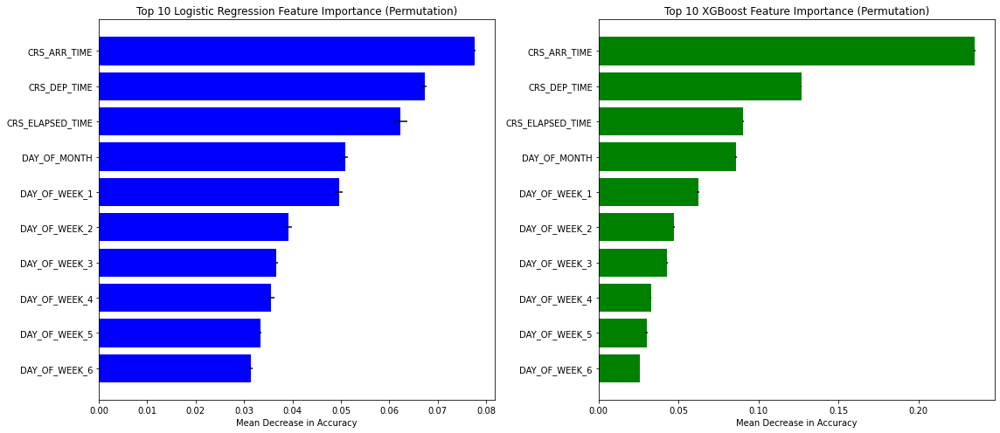

In [42]:
# Calculate permutation importance for logistic regression
log_reg_sorted_idx = np.argsort(log_reg_importance_mean)[::-1][:10]  # Keep only the top 10 features
log_reg_features = X_test.columns[log_reg_sorted_idx]
log_reg_importance_mean = log_reg_importance_mean[log_reg_sorted_idx]
log_reg_importance_std = log_reg_result.importances_std[log_reg_sorted_idx]

# Calculate permutation importance for XGBoost
xgb_sorted_idx = np.argsort(xgb_importance_mean)[::-1][:10]  # Keep only the top 10 features
xgb_features = X_test.columns[xgb_sorted_idx]
xgb_importance_mean = xgb_importance_mean[xgb_sorted_idx]
xgb_importance_std = xgb_result.importances_std[xgb_sorted_idx]

# Plotting side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

# Logistic Regression plot
ax1.barh(log_reg_features, log_reg_importance_mean, xerr=log_reg_importance_std, color='blue', align='center')
ax1.set_title('Top 10 Logistic Regression Feature Importance (Permutation)')
ax1.set_xlabel('Mean Decrease in Accuracy')
ax1.invert_yaxis()

# XGBoost plot
ax2.barh(xgb_features, xgb_importance_mean, xerr=xgb_importance_std, color='green', align='center')
ax2.set_title('Top 10 XGBoost Feature Importance (Permutation)')
ax2.set_xlabel('Mean Decrease in Accuracy')
ax2.invert_yaxis()

plt.tight_layout()
plt.show()